Course name: Research Skills: Image Analysis <br>
Course code: 880877-M-3 <br>
Take-home Assignment <br>
Academic Year: 2021-2022, Blok 3. <br>
Sharon Ong <br>
Department of Cognitive Science and Artificial Intelligence <br>
Tilburg University <br>

In [101]:
# install libraries
# !pip install --user imageio
# !pip install --user scikit-image
# !pip install opencv-python
# !pip install plotly


In [102]:
import os
import numpy as np## 1.1 Loading an image 
import math
import time
from timeit import default_timer as timer
# import cv2 #TODO

import matplotlib.pyplot as plt
%matplotlib inline   

import plotly.express as px

from PIL import Image

import imageio
from skimage import io, color, data, img_as_float, filters, morphology, exposure
from skimage.color import label2rgb
from skimage.exposure import histogram 
from skimage.filters import try_all_threshold, threshold_otsu, prewitt_v, prewitt_h, prewitt, median
from skimage.filters.rank import median
from skimage.measure import label, regionprops
from skimage.morphology import square, rectangle, diamond, disk, cube,  octahedron, ball, star, octagon 
from skimage.morphology import binary_dilation, binary_erosion, binary_opening, binary_closing
from skimage.morphology import dilation, erosion, opening, closing, white_tophat
from skimage.morphology import skeletonize, thin
from skimage.morphology import binary_dilation 
from skimage.morphology import remove_small_objects
from skimage.transform import rescale, pyramid_gaussian, pyramid_laplacian, rotate
from skimage.util import random_noise, img_as_float

import scipy.ndimage
from scipy import signal
from scipy.ndimage import binary_fill_holes
from scipy.fftpack import fftn, ifftn, fftshift, ifftshift #'fft 1d, fft, 2d'

from mpl_toolkits.mplot3d import Axes3D  

In [103]:
# os.makedirs("images_save", exist_ok=True)

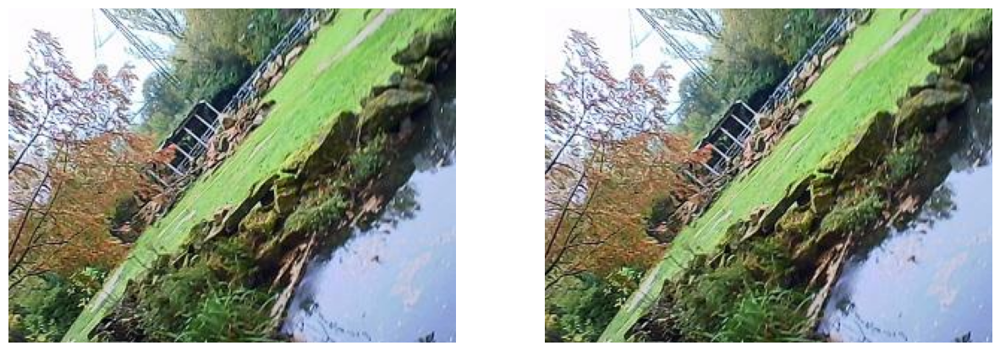

In [104]:
def plotImageGrid(image_Array:list, image_Titles_input=None, cmaps_input=None, n_rows = 2, figsize=(15,10)):

    # create empty names or cut name len
    image_Titles = [""]*len(image_Array) # set default titles
    
    cmaps = ["viridis"]*len(image_Array) # set default color maps
    if cmaps_input == "gray": #overwrite all with gray
        cmaps = ["gray"]*len(image_Array)

    # try to overwrite default names
    for i in range(len(image_Array)):
        try:
            if image_Titles_input:
                image_Titles[i] = image_Titles_input[i]
        except:
            pass
        try:
            if cmaps_input and cmaps_input != "gray":
                cmaps[i] = cmaps_input[i]
        except:
            pass

    n_columns = math.ceil(len(image_Array)/n_rows) #round up the number of columns needed
    # print(n_columns)
    plt.figure(figsize=figsize)
    for i ,(img, title, cmap) in enumerate(zip(image_Array, image_Titles, cmaps)):
        plt.subplot(n_rows,n_columns,i+1)
        plt.title(title) 
        if cmap!= '':
            plt.imshow(img, cmap=cmap)
        else:
             plt.imshow(img)
        plt.axis('off')
        
    plt.show()

im_color = io.imread("images/2111832_rgbimage.jpg") 
plotImageGrid([im_color,im_color], n_rows=1)

#### **1. Image smoothing in the spatial and frequency domain**
You are provided with a color image in (XXXXXX rgbimage.jpg) in “Files/assignment/files/XXXXX.zip” where XXXXX is your SSID. These images were taken by your course coordinator’s child at 4 years old.


#### 1.1 (5 points) Convert the color image which you have been provided to grayscale. Display the image with a gray colormap and an appropriate title. Points breakdown: 3 points for converting the color image to gray, 2 points for displaying your image

Text(0.5, 1.0, 'Gray scale image \n(2111832_rgbimage.jpg)')

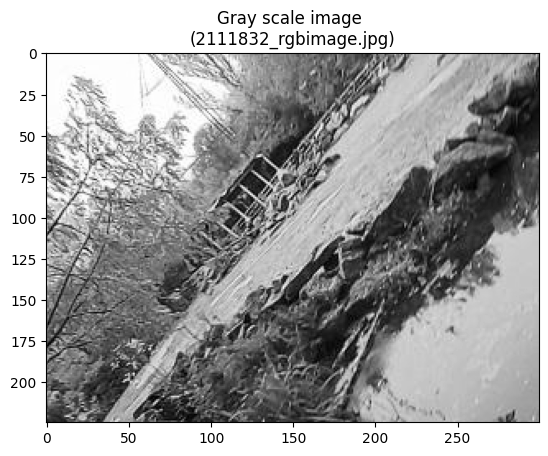

In [105]:
# read the image
im_color = io.imread("images/2111832_rgbimage.jpg") 

# convert to gray
im_gray = color.rgb2gray(im_color)
# show the image
plt.imshow(im_gray,cmap='gray')
plt.title('Gray scale image \n(2111832_rgbimage.jpg)')

#### 1.2 (5 points) Add 10% salt and pepper noise to the grayscale image

Text(0.5, 1.0, 'Gray scale image with 10% salt and pepper noise \n(2111832_rgbimage.jpg)')

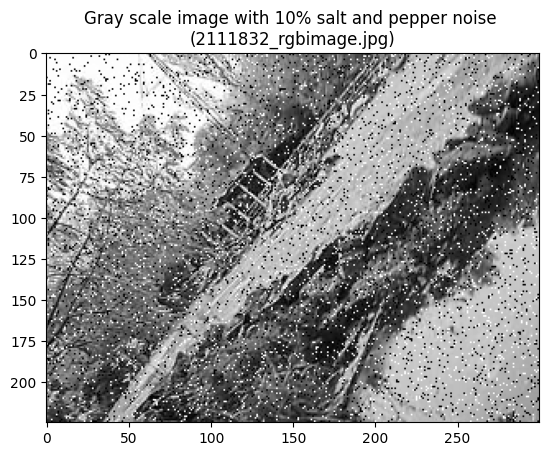

In [106]:
seed = 42
# add 10% salt and pepper noise
im_gray_sp = random_noise(im_gray, seed=seed, mode='s&p', amount=0.10)
# show the image
plt.imshow(im_gray_sp,cmap='gray')
plt.title('Gray scale image with 10% salt and pepper noise \n(2111832_rgbimage.jpg)')

#### 1.3 (5 points) Denoise the noisy image by performing a Gaussian blur with ‘sigma=1‘ in the spatial domain. Display your denoised image. Points breakdown: 3 points for denosing the image, 2 points for displaying your image.


Text(0.5, 1.0, 'Gray scale image with 10% salt and pepper noise and \ngaussian blur (sigma=1) (2111832_rgbimage.jpg)')

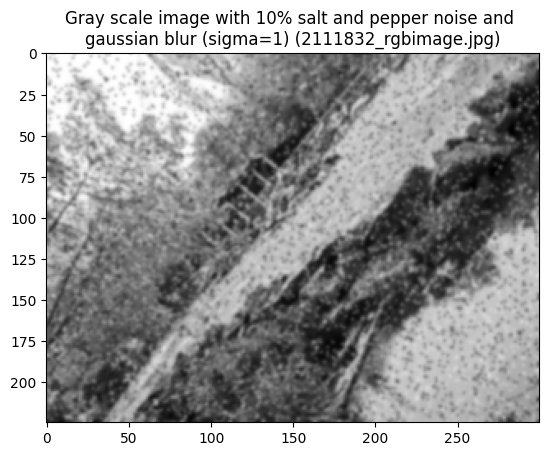

In [107]:
# Apply gaussian blur with sigma = 1
im_gauss = scipy.ndimage.gaussian_filter(im_gray_sp, sigma=1)

plt.imshow(im_gauss,cmap='gray')
plt.title('Gray scale image with 10% salt and pepper noise and \ngaussian blur (sigma=1) (2111832_rgbimage.jpg)')

#### 1.4 (5 points) Convert both the “clean” grayscale image (output of Q1.1) and noisy image (output of Q1.2) to the frequency domain and display the two FFT spectrums (FFT magnitude). Points breakdown: 2 points for converting to the frequency domain, 3 point for displaying the FFT spectrums.


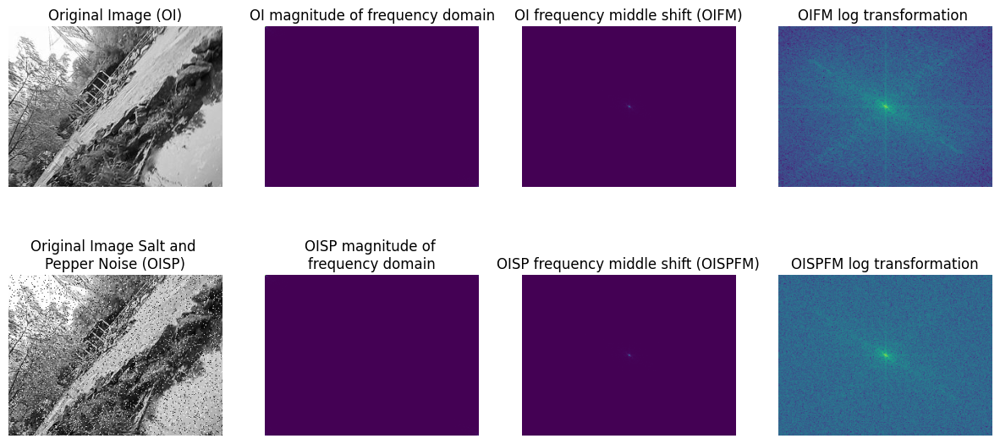

In [108]:
im_F = fftn(im_gray)
im_sp_F = fftn(im_gray_sp)

# Show magnitude of Frequency domain
im_S = abs(im_F)
im_sp_S = abs(im_sp_F) 

# shift frequency to the middle of the picture
im_Fc = fftshift(im_S)
im_sp_Fc = fftshift(im_sp_S)

# apply a log transformation
im_S2 = np.log(1 + abs(im_Fc))
im_sp_S2 = np.log(1 + abs(im_sp_Fc))

plotImageGrid(
    [im_gray, im_S, im_Fc, im_S2, im_gray_sp, im_sp_S, im_sp_Fc, im_sp_S2], # 
    ["Original Image (OI)","OI magnitude of frequency domain","OI frequency middle shift (OIFM)","OIFM log transformation ","Original Image Salt and \nPepper Noise (OISP)","OISP magnitude of \nfrequency domain","OISP frequency middle shift (OISPFM)","OISPFM log transformation"],
    cmaps_input= ["gray", "viridis","viridis","viridis","gray","viridis","viridis","viridis"],
    n_rows=2,
    figsize=(15,7))

#### 1.5 (5 points) Denoise the noisy image by performing a Gaussian blur with ‘sigma=1‘ in the frequency domain. Convert your denoised solution back to the spatial domain. Display your denoised image.Points breakdown: 2 points for denoising. 2 points for converting your solution to the spatial domain, 1 point for displaying the image.


In [109]:
def gaussianBlurr(im_input, sigma):
    im_freq = fftn(im_input)

    gauss_kernel = np.outer(signal.gaussian(im_freq.shape[0], sigma), signal.gaussian(im_freq.shape[1], sigma))
    freq_kernel = fftn(ifftshift(gauss_kernel))

    assert(im_freq.shape == gauss_kernel.shape)

    # Gaussian blur operation 
    im_freqconvolved = im_freq*freq_kernel
    im_convolved = ifftn(im_freqconvolved).real

    return im_convolved

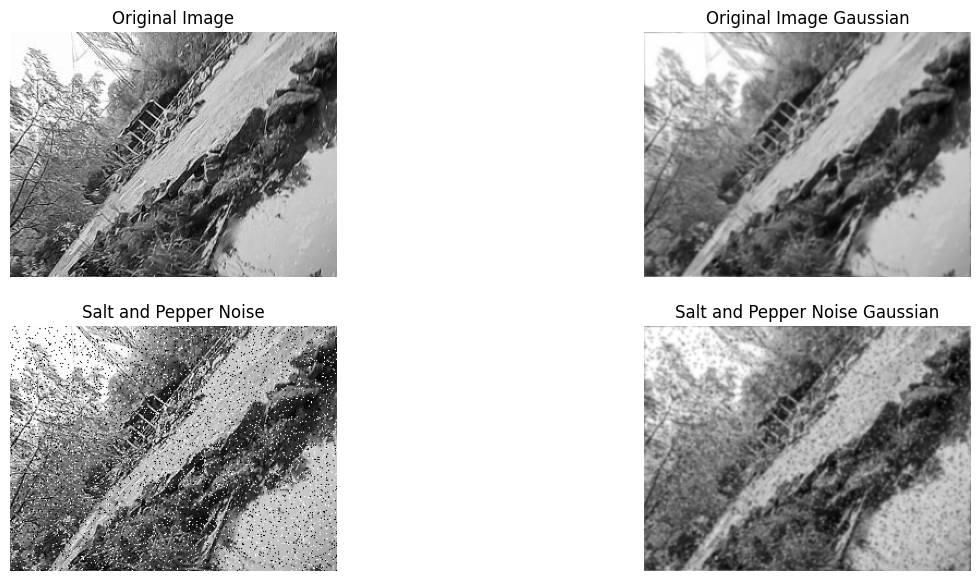

In [110]:
# 2D Gaussian kernel of size image with variance of 2

# im_F = fftn(im_gray)
# height, width = im_F.shape[0], im_F.shape[1]
# gauss_kernel = np.outer(signal.gaussian(height, 1), signal.gaussian(width,1))
# im_gray_Gaussian_1 = signal.fftconvolve(im_gray, gauss_kernel, mode = 'full')

# im_sp_F = fftn(im_gray_sp)
# height, width = im_sp_F.shape[0], im_sp_F.shape[1]
# gauss_kernel = np.outer(signal.gaussian(height, 1), signal.gaussian(width,1))
# im_gray_sp_Gaussian_1 = signal.fftconvolve(im_gray_sp, gauss_kernel, mode = 'full')


im_gray_Gaussian_1 = gaussianBlurr(im_gray, sigma = 1)
im_gray_sp_Gaussian_1 = gaussianBlurr(im_gray_sp, sigma = 1)


plotImageGrid(
    [im_gray,im_gray_Gaussian_1 , im_gray_sp, im_gray_sp_Gaussian_1], # 
    ["Original Image","Original Image Gaussian","Salt and Pepper Noise", "Salt and Pepper Noise Gaussian"],
    cmaps_input= "gray",
    n_rows=2,
    figsize=(15,7))

#### 1.6 (10 points) Compare the time taken to run Gaussian blur operations in the spatial domain vs the frequency domain the following 6 values of ‘sigma‘ - 1, 2, 16, 32, 64 and 128. Plot the time taken vs sigma for both spatial and frequency domain in the same plot. Briefly comment on your plot. When ‘sigma‘ is larger, the kernel is larger. Which domain is preferred for larger kernels? Points breakdown: 3 points for running the operations in the spatial domain. 3 points for running the operations in the frequency domain. 1 point for the plot. 2 points for your comment on the plot and answering the question.

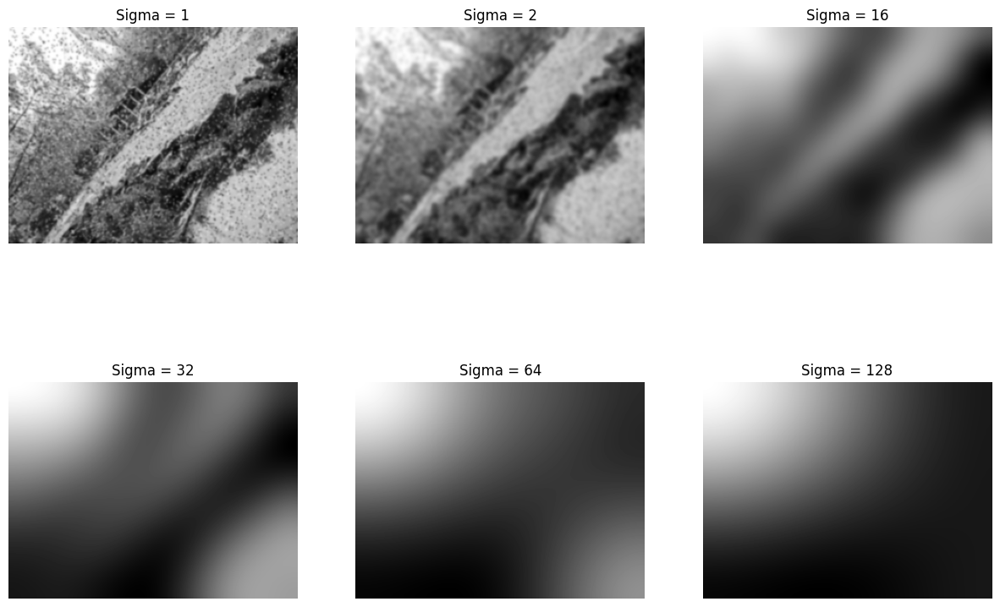

In [111]:
# Spacial domain (gaussian filter)
spacial_time_taken = []
spacial_images = []

sigma_range = [1,2,16,32,64,128]
for sigma in sigma_range:
    start = timer()

    im_gauss = scipy.ndimage.gaussian_filter(im_gray_sp, sigma=sigma)
    spacial_images.append(im_gauss)

    end = timer()

    spacial_time_taken.append(end - start)


plotImageGrid(spacial_images, ["Sigma = "+str(x) for x in sigma_range], cmaps_input="gray")

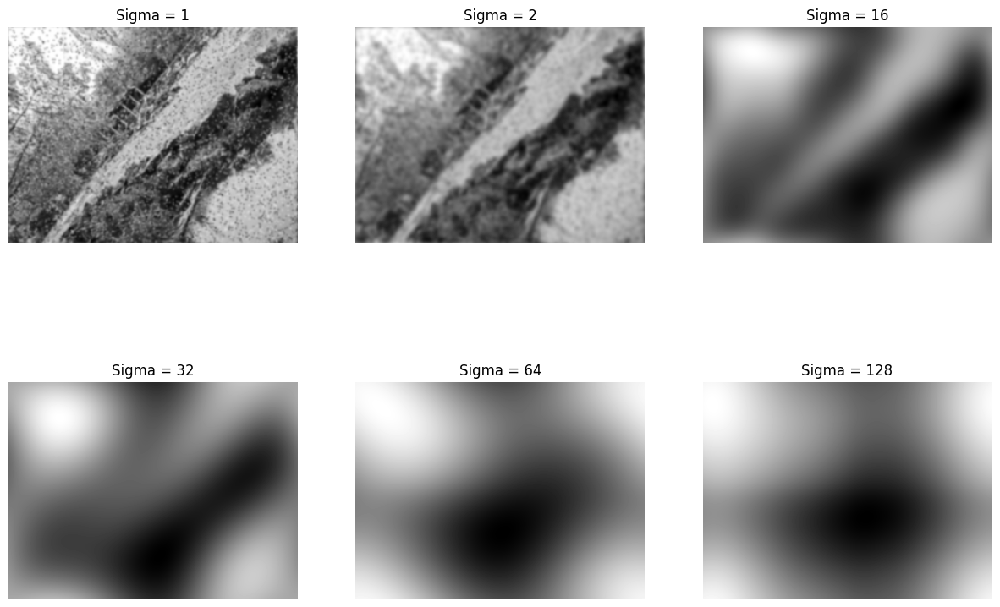

In [112]:
# Spacial domain (gaussian filter)
frequency_time_taken = []
frequency_images = []

for sigma in sigma_range:
    start = timer()
    
    im_gaussian = gaussianBlurr(im_gray_sp, sigma)

    # im_gauss = scipy.ndimage.gaussian_filter(im_gray_sp, sigma=sigma)
    frequency_images.append(im_gaussian)

    end = timer()
    frequency_time_taken.append(end - start)


plotImageGrid(frequency_images, ["Sigma = "+str(x) for x in sigma_range], cmaps_input="gray")

In [113]:
px.bar(x=range(1,7),y= [frequency_time_taken], barmode="group")

import plotly.graph_objects as go


fig = go.Figure(data=[
    go.Bar(name='Spacial domain <br>gaussian filters', x=["Sigma = "+str(x) for x in sigma_range], y=spacial_time_taken),
    go.Bar(name='Frequency domain <br>gaussian filters', x=["Sigma = "+str(x) for x in sigma_range], y=frequency_time_taken)
])
# Change the bar mode
fig.update_layout(barmode='group', title="Time taken to perform gaussian filtering")
fig.show()

In [114]:
# when sigma is larger, the time taken in the spacial domain 
# increases exponentially. The time taken for the frequency domain 
# stays roughly the same independent from the kernel size 
# (between 6 and 9 millisecond).
# For sigma = 1 and sigma = 2 the spacial domain filter is faster
# Therefore it is preferable to perform the gaussian filter with a 
# large kernel size in the frequency domain, if the kernel is big

#### **2. Extracting vessels from raw fundus images**
You are provided with a color image (XXXXXX vesselimage.jpg) and the corresponding binary segmentation
mask (XXXXXX vesselmask.jpg) in “Files/assignment/files/XXXXX.zip” where XXXXX is your SSID. The
binary image is the manual annotation results. These images are cropped from images in the High-Resolution
Fundus (HRF) Image Database [1].


#### 2.1. (5 points) Load the color image (XXXXXX vesselimage.jpg). Using subplots, display each color channel separately

In [115]:
im_vessels = io.imread('images/2111832_vesselimage.jpg')
im_vessels_mask = io.imread('images/2111832_vesselmask.jpg')

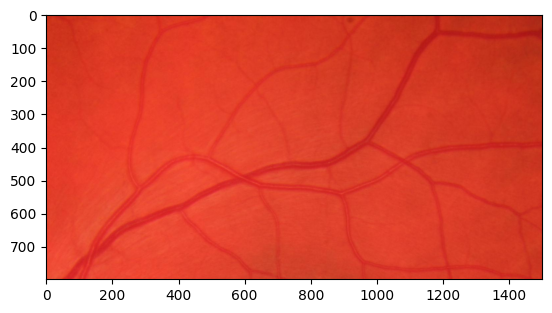

In [116]:
plt.imshow(im_vessels)

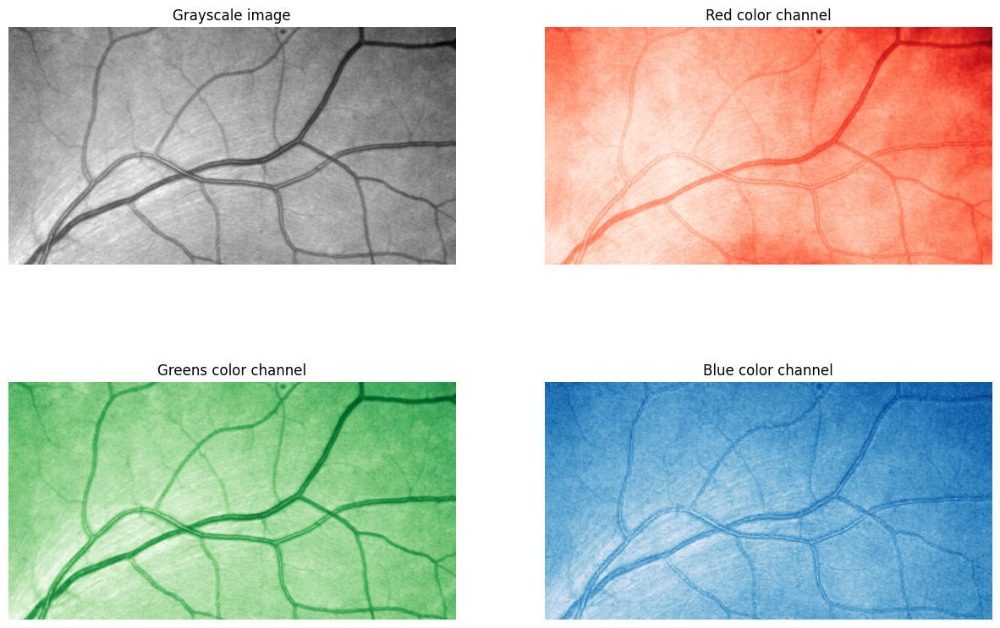

In [117]:
im_vessels_gray = color.rgb2gray(im_vessels)

im_vessels_r = im_vessels[:, :, 0]
im_vessels_g = im_vessels[:, :, 1]
im_vessels_b = im_vessels[:, :, 2]

image_titles =  ["Grayscale image", 'Red color channel', 'Greens color channel', 'Blue color channel']
cmaps = ["gray", "Reds_r", "Greens_r", "Blues_r"]

plotImageGrid([im_vessels_gray, im_vessels_r, im_vessels_g, im_vessels_b], image_Titles_input=image_titles, cmaps_input=cmaps, n_rows=2)

#### 2.2. (5 points) Convert the color image to HSV and display the hue, saturation and value channels.


In [118]:
im_vessels_hsv = color.rgb2hsv(im_vessels)

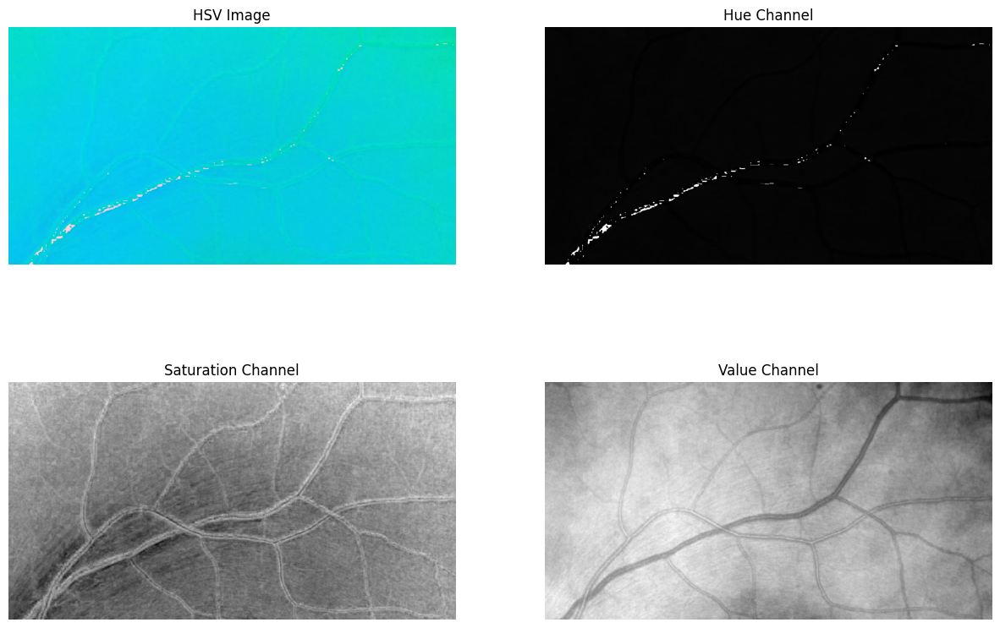

In [119]:
im_vessels_hue = im_vessels_hsv[:,:,0]
im_vessels_saturation = im_vessels_hsv[:,:,1]
im_vessels_value = im_vessels_hsv[:,:,2]

plotImageGrid([im_vessels_hsv, im_vessels_hue, im_vessels_saturation, im_vessels_value], 
              image_Titles_input=['HSV Image','Hue Channel', 'Saturation Channel', 'Value Channel'], 
              cmaps_input=["","gray","gray","gray"])



#### 2.3. (20 points) Segment the vessels to obtain a binary image where pixels representing the vessels are set to 1. You should compare two different image segmentation algorithms. You can apply morphological operations on these images. <br>
#### Points breakdown: Maximum of 10 points for each method. Comparing two thresholding algorithms only counts for 1 method. Report the steps you took to compute two image segmentation algorithms as comments in your code. Display the results of image processing at each step with appropriate titles.For each method: Full (10) points if each method successfully segments all the large vessels, most of the smaller vessels and none of the background. Show the results for each step you took. If the vessel shapes are slightly distorted or a 10% of the background is segmented or 50% of the smaller vessels are missing, you will get a maximum of 7 points each. If you make an attempt and the results are poor, you can get a maximum of 5 points each.


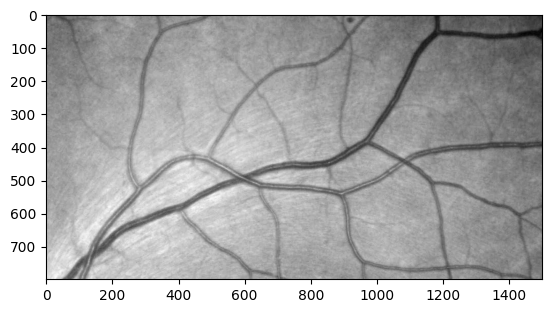

In [120]:
# start: 
plt.imshow(im_vessels_gray, cmap="gray")

In [121]:
im_vessels_gray_256 = im_vessels_gray.ravel().copy()*256
im_vessels_gray_256 = im_vessels_gray_256.astype('uint')

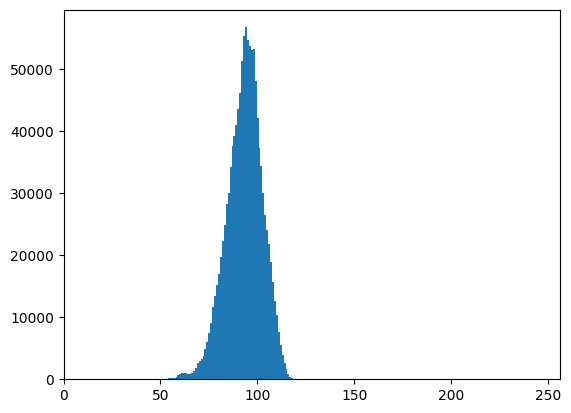

In [122]:
fig, ax = plt.subplots(1, 1)
ax.hist(im_vessels_gray_256, bins=256, range=[0, 255])
ax.set_xlim(0, 256);

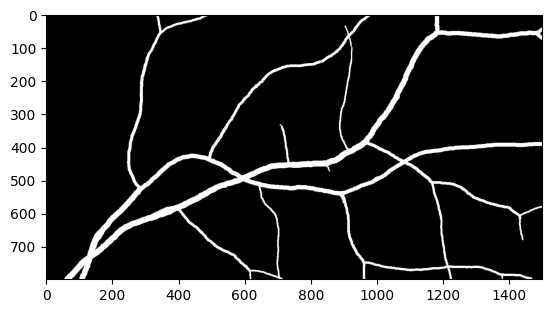

In [123]:
# goal: 
plt.imshow(im_vessels_mask, cmap="gray")

In [124]:
# TODO try filters.threshold_sauvola

General idea: 
- Vessels are in general darker (This can be easily seen in the grayscale and hsv - value image)
- Try out simple thresholding methods first
    - Result: It does not work out of the box. The Corner in the top right is too dark


C:\Users\tobi1\AppData\Local\Temp\ipykernel_23988\1914214159.py:4: UserWarning:

Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.



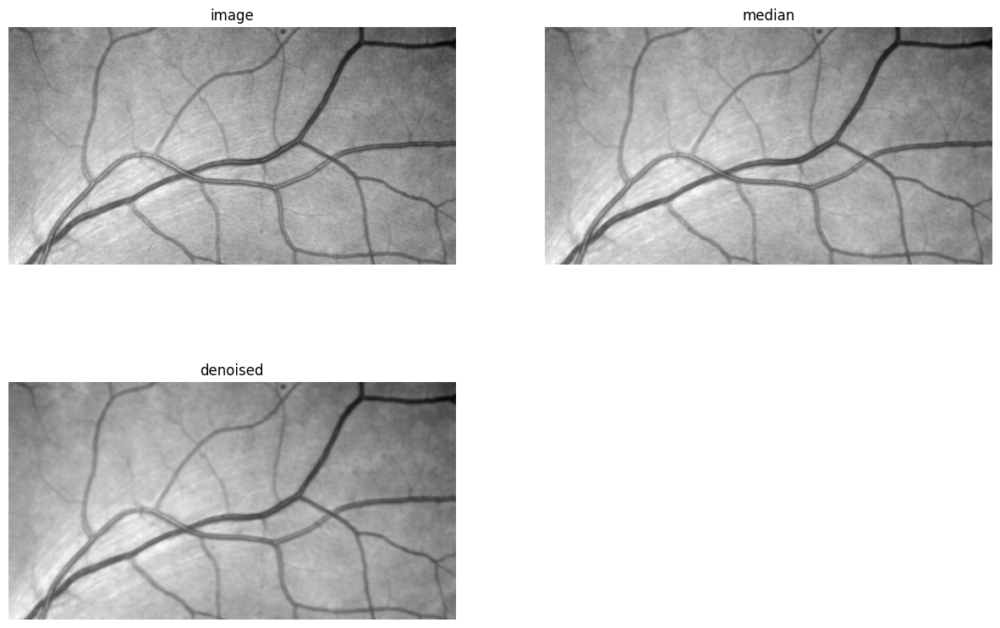

In [125]:
from skimage.restoration import denoise_tv_bregman
denoised = denoise_tv_bregman(im_vessels_gray, 4)
d = disk(4)
median = filters.rank.median(im_vessels_gray, d)
titles = ['image', 'median', 'denoised']
plotImageGrid( [im_vessels_gray, median, denoised], image_Titles_input=titles, cmaps_input='gray')

In [126]:
# ## Remove noise # https://scikit-image.org/docs/stable/api/skimage.restoration.html#skimage.restoration.cycle_spin
# from skimage.restoration import cycle_spin, denoise_wavelet

# sigma = 0.05
# img = im_vessels_gray + sigma * np.random.standard_normal(im_vessels_gray.shape)

# im_vessels_denoised = cycle_spin(img, func=denoise_wavelet, max_shifts=(1,1))
# plt.imshow(im_vessels_denoised, cmap="gray")

Thresholding on 


<Figure size 640x480 with 0 Axes>

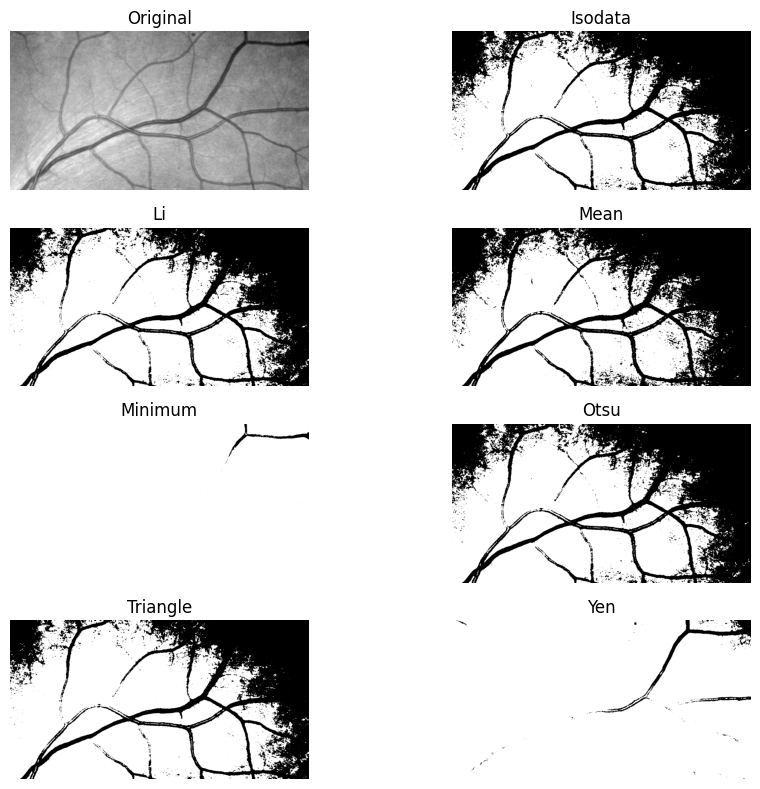

<Figure size 640x480 with 0 Axes>

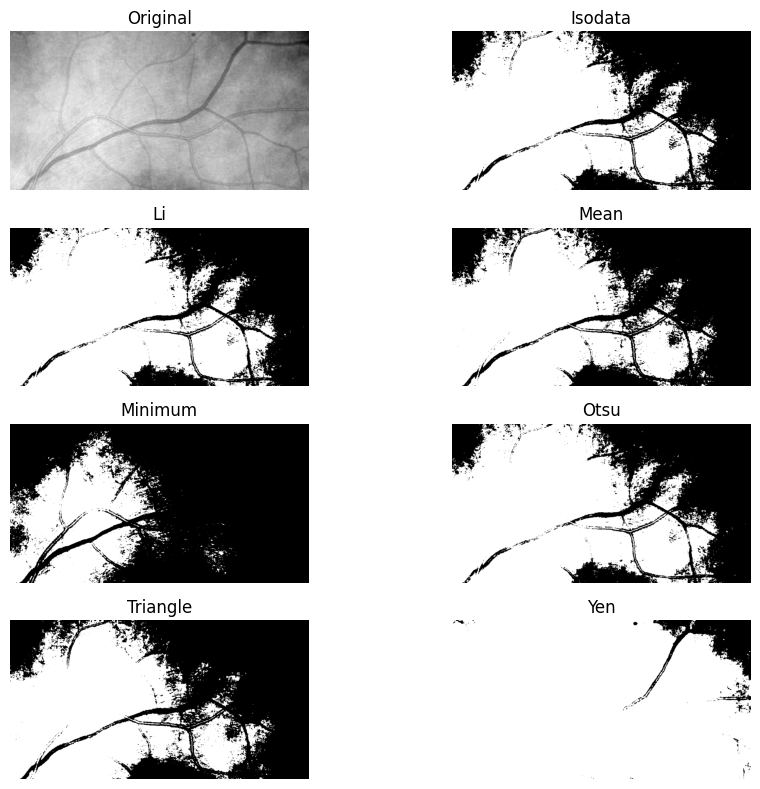

In [127]:
# Thresholding methods:
# Result: the intensity is too high in the top right corner. 

print('Thresholding on ')
plt.figure()
fig, ax = try_all_threshold(im_vessels_gray, figsize=(10, 8), verbose=False)
plt.show()

# fig, ax = try_all_threshold(im_vessels_r, figsize=(10, 8), verbose=False)
# plt.show()

# fig, ax = try_all_threshold(im_vessels_g, figsize=(10, 8), verbose=False)
# plt.show()

# fig, ax = try_all_threshold(im_vessels_b, figsize=(10, 8), verbose=False)
# plt.show()

# fig, ax = try_all_threshold(im_vessels_hue, figsize=(10, 8), verbose=False)
# plt.show()

# fig, ax = try_all_threshold(im_vessels_saturation, figsize=(10, 8), verbose=False)
# plt.show()

plt.figure()
fig, ax = try_all_threshold(im_vessels_value, figsize=(10, 8), verbose=False)
plt.show()

# unsupervised

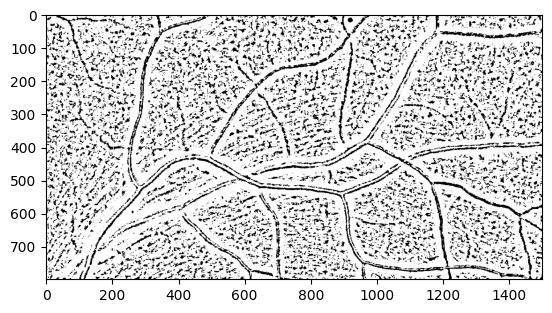

In [128]:
from skimage.filters import (threshold_otsu, threshold_niblack,
                             threshold_sauvola)

window_size = 25
thresh_niblack = threshold_niblack(im_vessels_gray, window_size=window_size, k=0.8)
thresh_otsu = threshold_otsu(im_vessels_gray)

image_thresholded = im_vessels_gray > thresh_niblack
plt.imshow(image_thresholded, cmap="gray")

In [136]:
import skimage.segmentation as seg
from copy import deepcopy

astronaut = deepcopy(im_vessels)
astronaut_gray = deepcopy(im_vessels_gray)


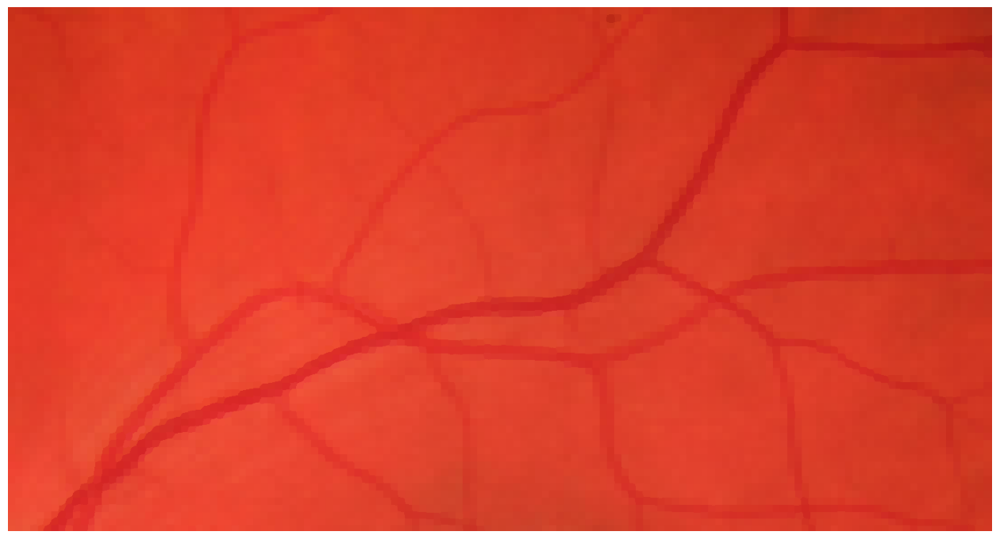

In [141]:
# SLIC works in color, so we will use the original astronaut
astronaut_slic = seg.slic(astronaut, n_segments=10000) #k-means

# label2rgb replaces each discrete label with the average interior color
image_show(color.label2rgb(astronaut_slic, astronaut, kind='avg'));

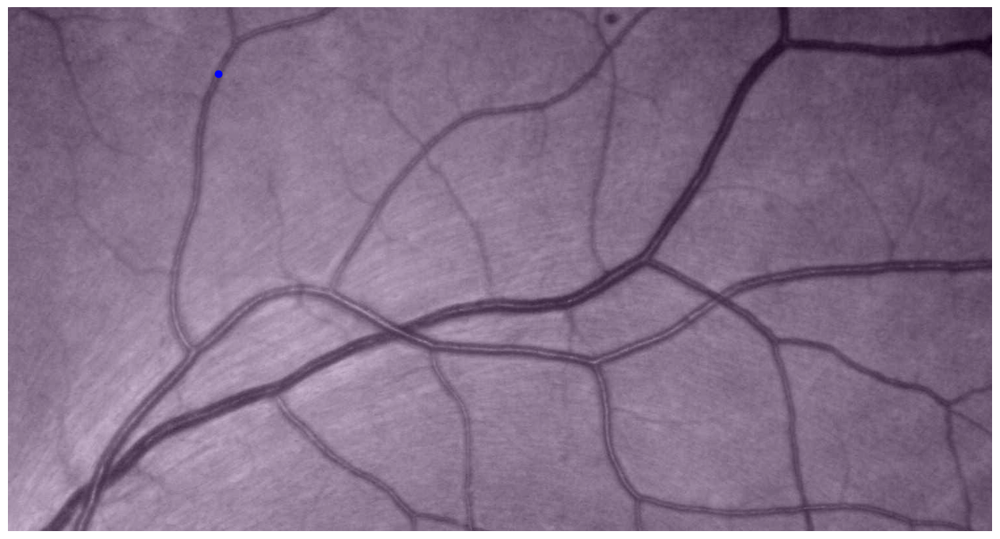

In [153]:
seed_point = (100, 220)  # Experiment with the seed point
flood_mask = seg.flood(astronaut_gray, seed_point, tolerance=0.3)  # Experiment with tolerance

fig, ax = image_show(astronaut_gray)
ax.imshow(flood_mask, alpha=0.3);
ax.plot(320,100,'bo')

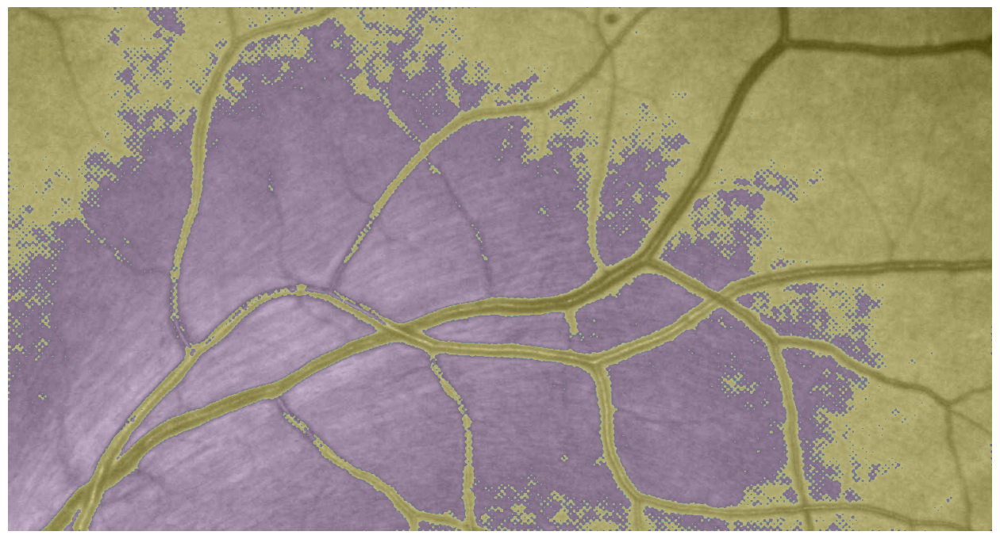

In [138]:
astronaut_gray
chan_vese = seg.chan_vese(astronaut_gray) #levelset #very good for biizaion

fig, ax = image_show(astronaut_gray)
ax.imshow(chan_vese == 0, alpha=0.3);

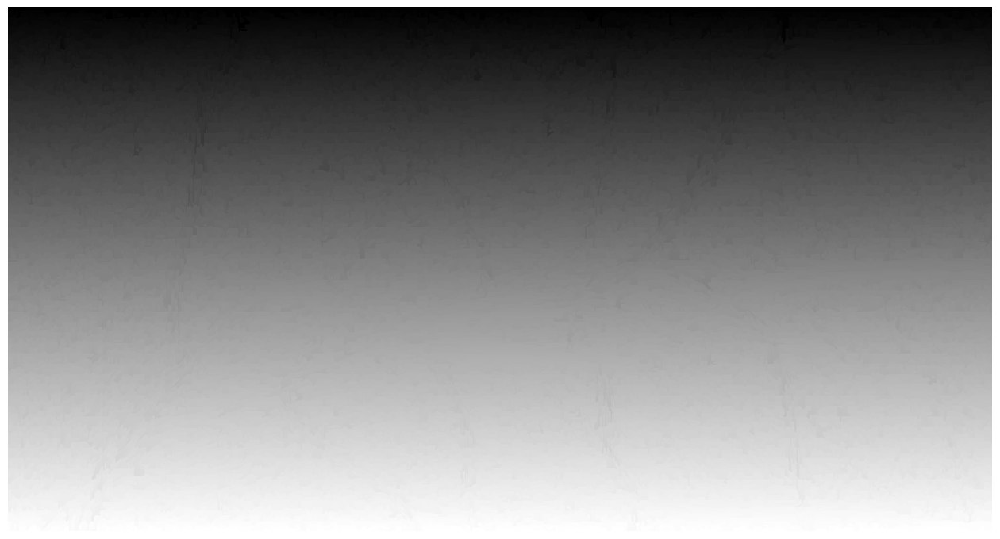

In [144]:
astronaut_felzenszwalb = seg.felzenszwalb(astronaut)  # Color required

image_show(astronaut_felzenszwalb);

# fix image

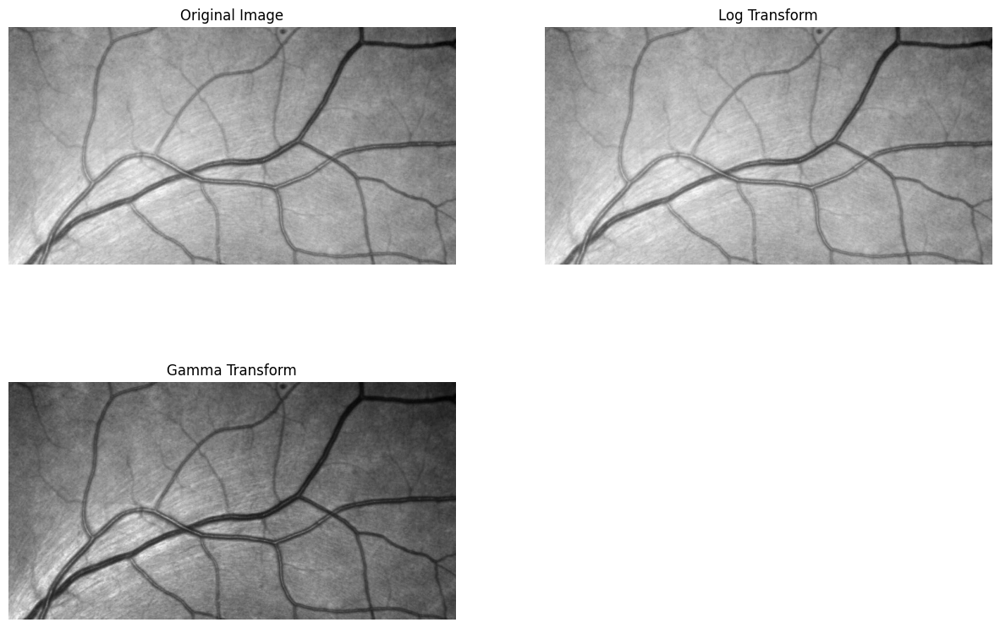

In [129]:
# Apply log and gamma transformation
# Result: does not fix the corner problem

im = im_vessels_gray

c = 10; #gain
gm = 3; #gamma 
# function for logarithmic transform

im_log2 = exposure.adjust_log(im, c)

# function for gamma transform
im_gamma2 = exposure.adjust_gamma(im, gm,c) 

plotImageGrid([im, im_log2, im_gamma2], 
              image_Titles_input=['Original Image','Log Transform', 'Gamma Transform'], 
              cmaps_input="gray")

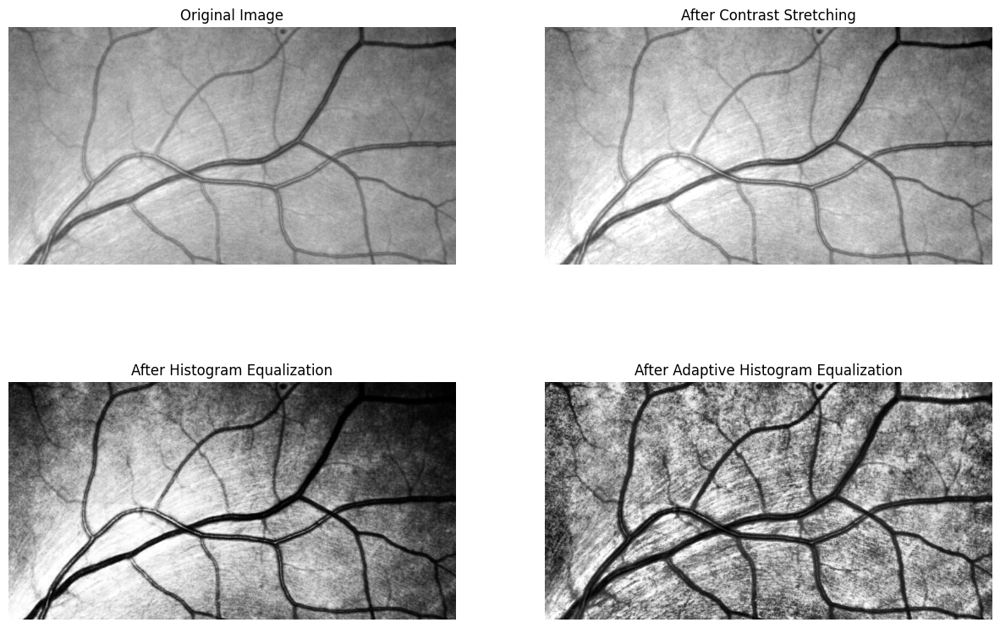

In [130]:
# Try to adjust the jistogram
# Result: the After Adaptive Histogram Equalization works very good

p2 = np.percentile(im,00.1)
p98 = np.percentile(im, 98) 
img_rescale = exposure.rescale_intensity(im, in_range=(p2, p98))

img_eq = exposure.equalize_hist(im)

img_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03)  # adaptive histogram equalization


plotImageGrid([im, img_rescale, img_eq, img_adapteq], 
              image_Titles_input=['Original Image','After Contrast Stretching', 'After Histogram Equalization', 'After Adaptive Histogram Equalization'], 
              cmaps_input="gray")

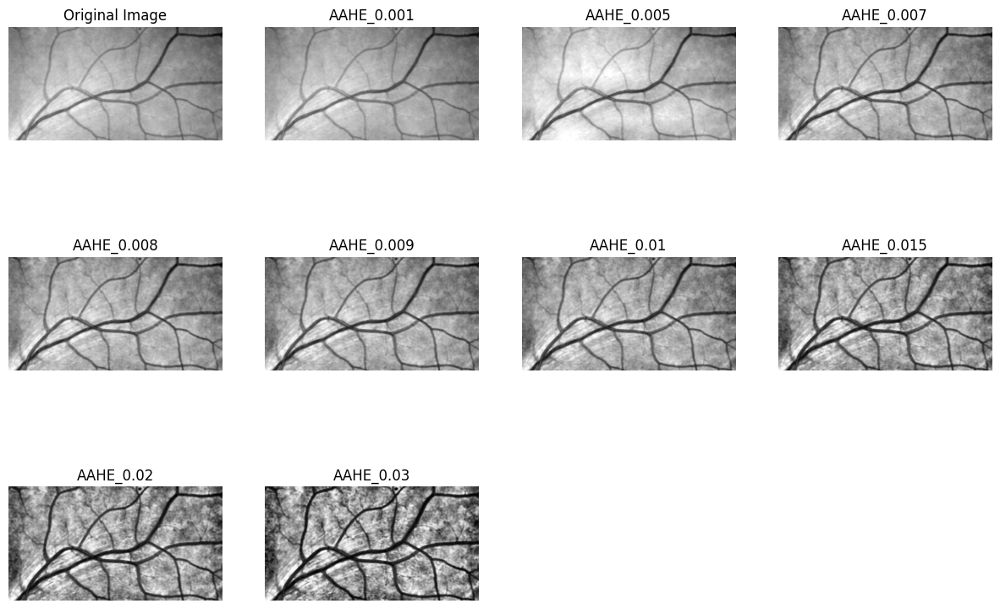

In [131]:
im = denoised

images = []
clip_limits = [0.001, 0.005, 0.007, 0.008, 0.009, 0.01, 0.015, 0.02,0.03]
for n in clip_limits:
    images.append(exposure.equalize_adapthist(im, clip_limit=n))  # adaptive histogram equalization

# 'After Adaptive Histogram Equalization' = AAHE

plotImageGrid([im]+images, 
              image_Titles_input=['Original Image']+["AAHE_"+str(n) for n in clip_limits], 
              cmaps_input="gray",
              n_rows=3)

In [132]:
img_denoised_hist = exposure.equalize_adapthist(denoised, clip_limit=0.001)
# fig, ax = try_all_threshold(img_denoised_hist, figsize=(10, 8), verbose=False)
plt.show()

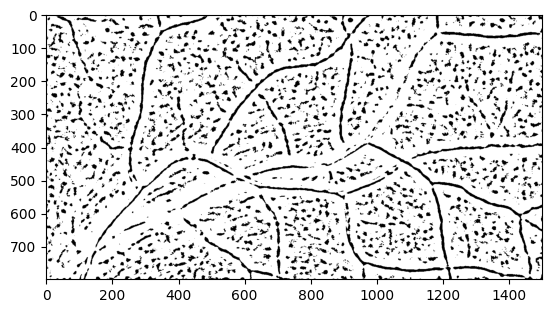

In [99]:
from skimage.filters import (threshold_otsu, threshold_niblack,
                             threshold_sauvola)

window_size = 25
thresh_niblack = threshold_niblack(denoised, window_size=window_size, k=0.8)
thresh_otsu = threshold_otsu(denoised)

image_thresholded = denoised > thresh_niblack
plt.imshow(image_thresholded, cmap="gray")

0.001
0.005
0.007
0.008
0.009
0.01
0.015
0.02
0.03


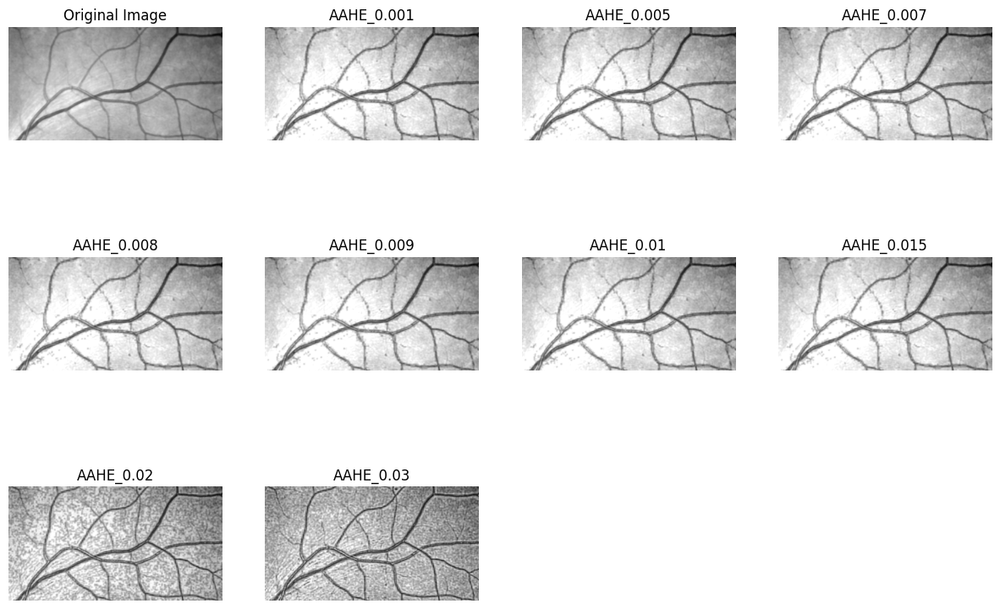

In [100]:
images = []
for n in clip_limits:
    print(n)
    kernel_size = disk(8)
    # big kernel size = 
    images.append(exposure.equalize_adapthist(im, kernel_size = 10, clip_limit=n))  # adaptive histogram equalization

# 'After Adaptive Histogram Equalization' = AAHE

plotImageGrid([im]+images, 
              image_Titles_input=['Original Image']+["AAHE_"+str(n) for n in clip_limits], 
              cmaps_input="gray",
              n_rows=3)

In [ ]:
# Fix with a filter that does histogram equalization based on neighbourhood

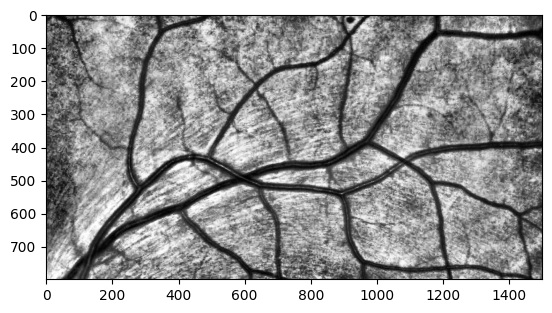

In [81]:
image = io.imread('images/2111832_vesselimage.jpg')

# Convert the RGB image to grayscale
gray = color.rgb2gray(image)

# Apply contrast-limited adaptive histogram equalization (CLAHE)
enhanced = exposure.equalize_adapthist(gray, clip_limit=0.03)

plt.imshow(enhanced,cmap="gray")



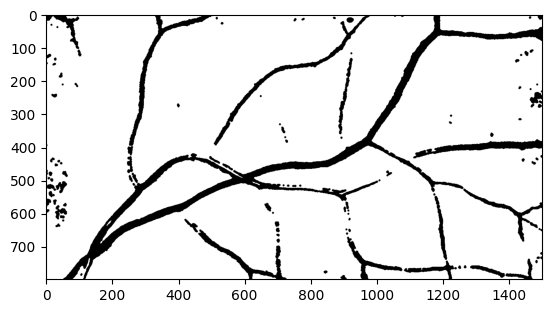

In [82]:
# Apply median filtering
filtered = filters.median(enhanced)

# Threshold the filtered image
threshold = filters.threshold_minimum(filtered)
binary = filtered > threshold

# Apply morphological operations
selem = morphology.disk(3)
binary = morphology.binary_closing(binary, selem)
binary = morphology.remove_small_objects(binary, min_size=50)

plt.imshow(binary,cmap="gray")

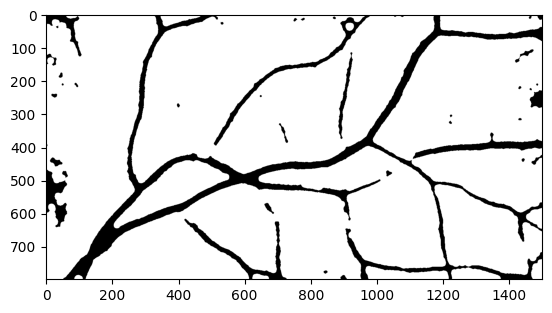

In [79]:
selem = disk(10)
binary1 = morphology.binary_opening(binary, selem)

plt.imshow(binary1,cmap="gray")

#### 2.4. (5 points) Overlay your segmentation solutions with the binary mask (manual annotation results).

#### 2.5. (5 points) Compute the Dice or Jaccard score between your solution and the binary mas

#### **3 Processing a binary image of segmented vessels**
You are provided with a binary image of vessels (XXXXXX vesselmask.jpg) where XXXXX is your SSID

####

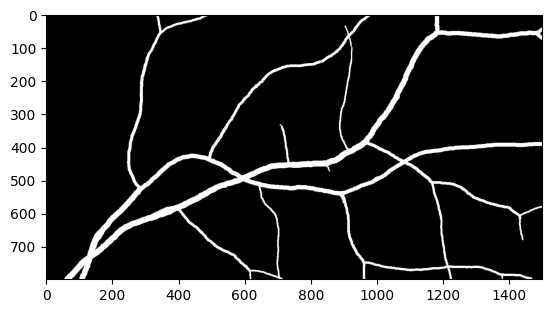

In [8]:
im_vessels_mask = io.imread('images/2111832_vesselmask.jpg')#.astype(float)

plt.imshow(im_vessels_mask, cmap="gray")

#### 3.1. (2 points) Remove smaller vessels (less than 8 pixels wide) with morphological opening

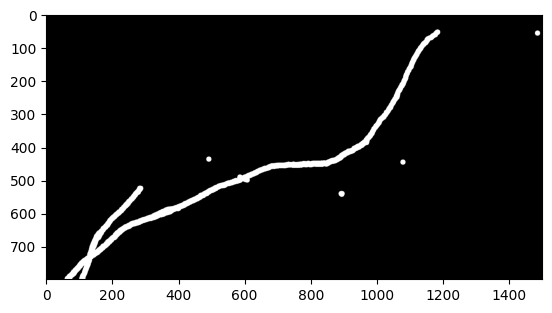

In [12]:
se = disk(8)
im2 = binary_opening(im_vessels_mask,se)

plt.imshow(im2, cmap="gray")

#### 3.2. (3 points) Apply morphological thinning to obtain a 1 pixel thin centerline of the vascular network

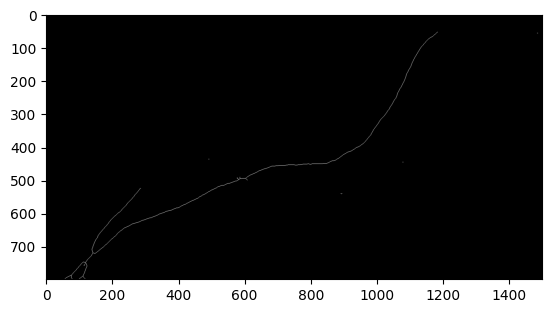

In [13]:
im3 = thin(im2)

plt.imshow(im3, cmap="gray")

#### 3.3. (5 points) Find overall length of the vascular network in the image after thinning

#### 3.4. (5 points) Find the length of the vascular network which is wider than 40 pixels. In other words, fin dHint: You can apply a medial axis transforms to compute the width of the vessel for the pixels of the skeleton

#### 3.5. (5 points) Computer orientation of the vascular network in the image after thinning. Display the orientation distribution of the vascular network in a polar (rose) plot

####

#### 3.6. (5 points) Compute the length and orientation of each branch (e.g. with the sknw package (https://github.com/ImagePy/sknw)).

####

####

####

####

####

####

####

####

####